<a href="https://colab.research.google.com/github/yankit247/Dashtoon_code/blob/main/Dashtoon_AI_generatror.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Content Image: 3.jpg, Style Image: 6.jpg
Stylistic Accuracy: 15.06451948173225
Content Preservation: [0.33191898]
Visual Appeal: 0.5445483326911926
--------------------------------------------------


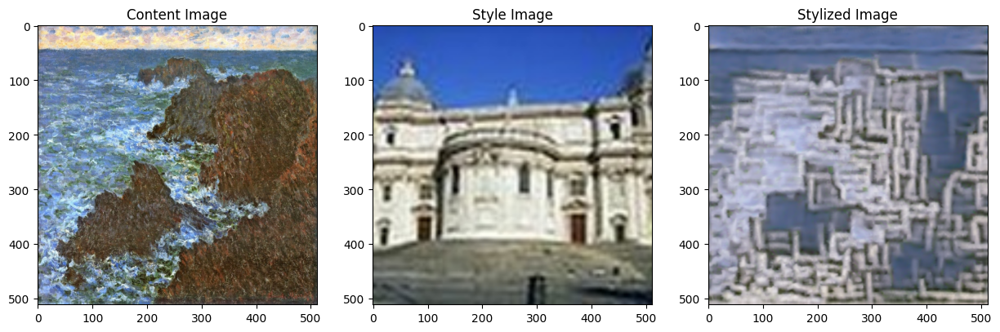

Content Image: Camille_Pissarro_1.jpg, Style Image: 0.jpg
Stylistic Accuracy: 33.86081523777616
Content Preservation: [0.55692595]
Visual Appeal: 0.5774880051612854
--------------------------------------------------


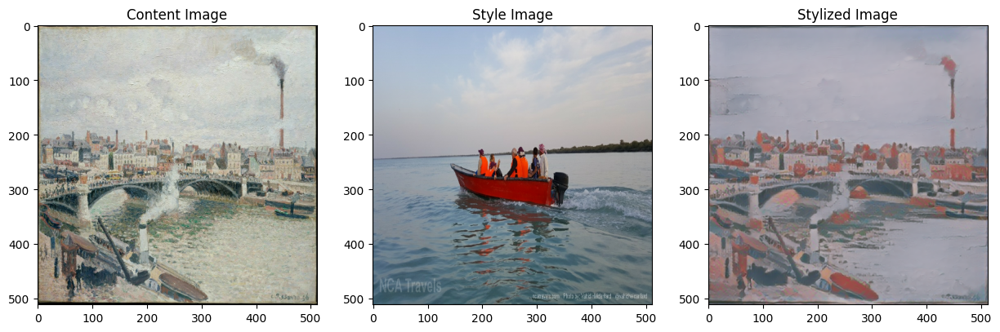

Content Image: Camille_Pissarro_18.jpg, Style Image: 10.jpg
Stylistic Accuracy: 18.575011232453207
Content Preservation: [0.40256473]
Visual Appeal: 0.5989872813224792
--------------------------------------------------


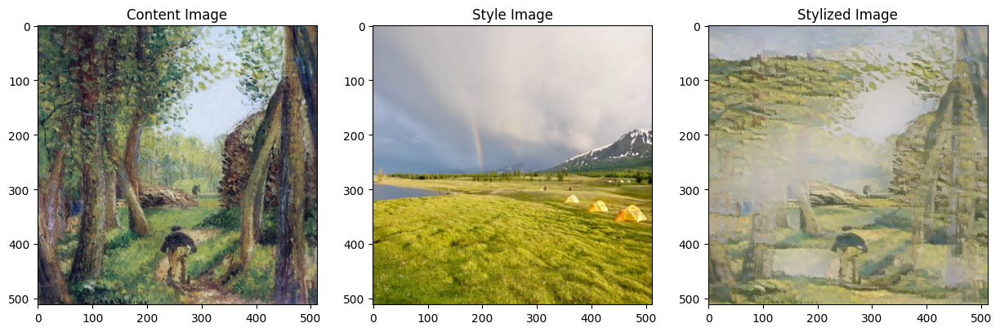

Content Image: Andrei_Rublev_14.jpg, Style Image: 11.jpg
Stylistic Accuracy: 13.309951901093344
Content Preservation: [0.30131122]
Visual Appeal: 0.5172831416130066
--------------------------------------------------


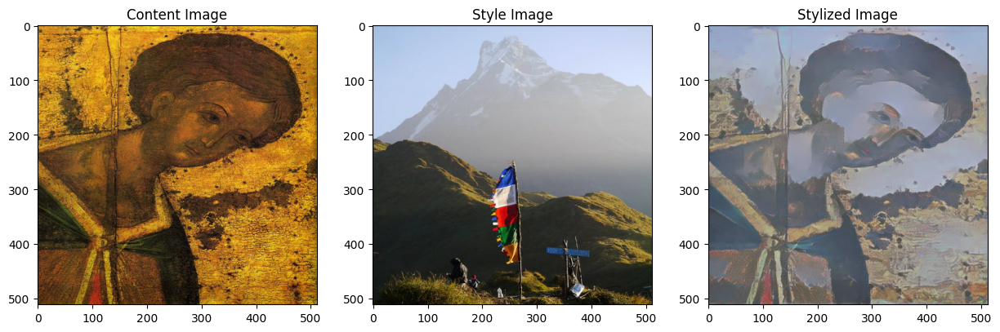

Content Image: Andrei_Rublev_21.jpg, Style Image: 13.jpg
Stylistic Accuracy: 11.023635017708996
Content Preservation: [0.42473555]
Visual Appeal: 0.47962984442710876
--------------------------------------------------


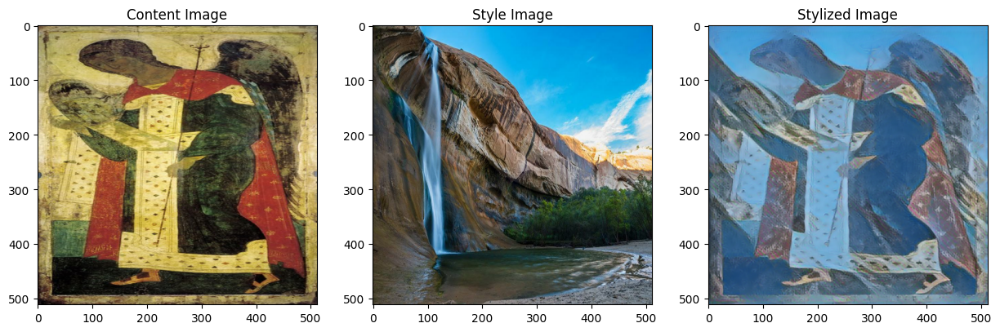

Content Image: Andrei_Rublev_29.jpg, Style Image: 14.jpg
Stylistic Accuracy: 6.6658333654496
Content Preservation: [0.3457063]
Visual Appeal: 0.5489005446434021
--------------------------------------------------


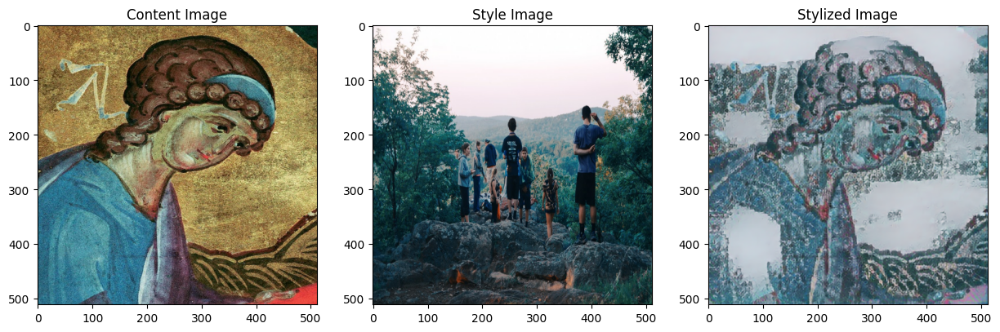

Content Image: El_Greco_2.jpg, Style Image: 15.jpg
Stylistic Accuracy: 12.600223131554865
Content Preservation: [0.20693886]
Visual Appeal: 0.5219269394874573
--------------------------------------------------


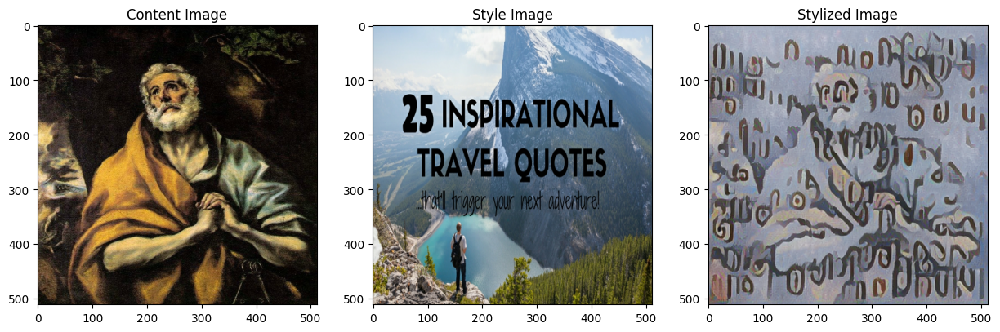

Content Image: El_Greco_30.jpg, Style Image: 17.jpg
Stylistic Accuracy: 15.012008355953695
Content Preservation: [0.3302116]
Visual Appeal: 0.47586116194725037
--------------------------------------------------


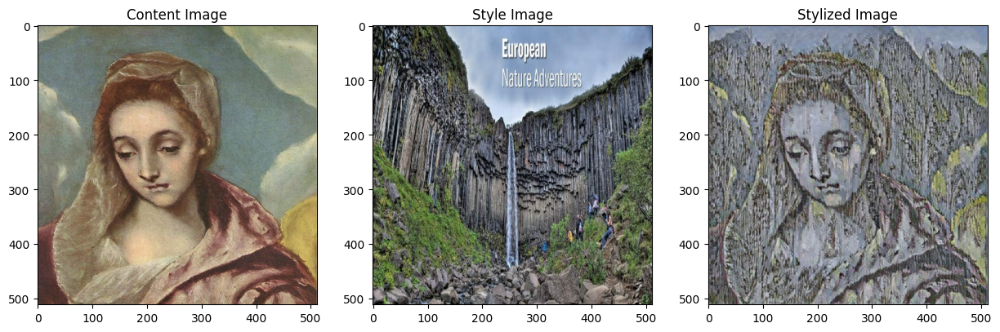

Content Image: Diego_Rivera_1.jpg, Style Image: 22.jpg
Stylistic Accuracy: 10.863253827030794
Content Preservation: [0.42822346]
Visual Appeal: 0.46157440543174744
--------------------------------------------------


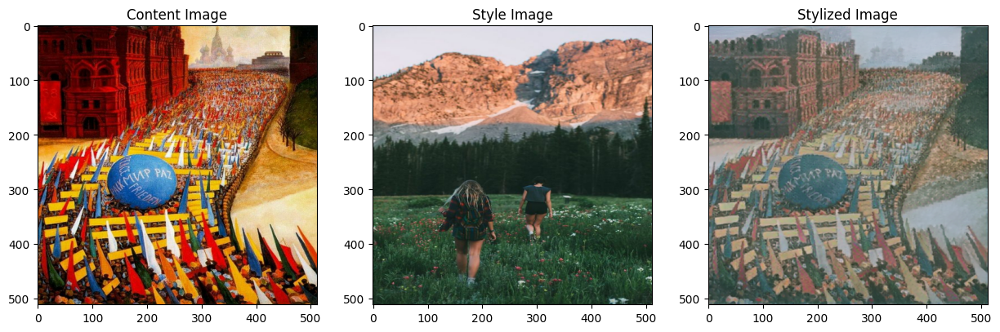

Content Image: Edouard_Manet_1.jpg, Style Image: 23.jpg
Stylistic Accuracy: 7.979476311100923
Content Preservation: [0.27018723]
Visual Appeal: 0.5440649390220642
--------------------------------------------------


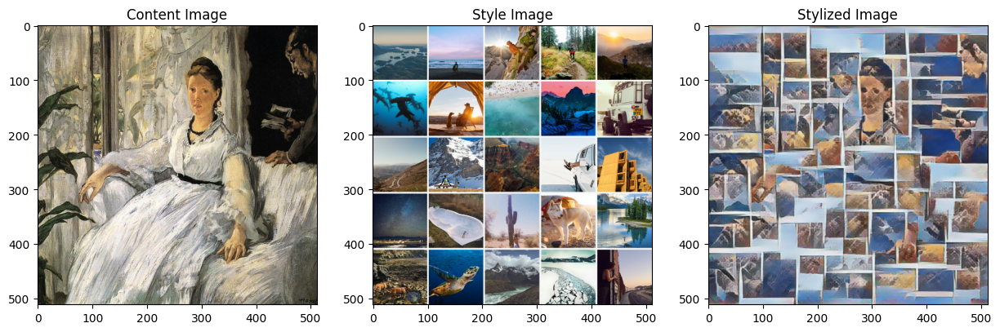

Content Image: Edouard_Manet_21.jpg, Style Image: 24.jpg
Stylistic Accuracy: 13.549307007135363
Content Preservation: [0.14320073]
Visual Appeal: 0.46882474422454834
--------------------------------------------------


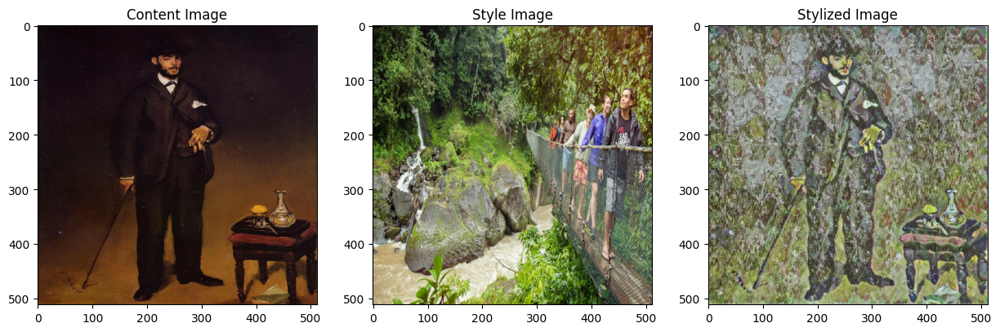

Content Image: Edouard_Manet_20.jpg, Style Image: 18.jpg
Stylistic Accuracy: 10.420326051015433
Content Preservation: [0.41835138]
Visual Appeal: 0.41637492179870605
--------------------------------------------------


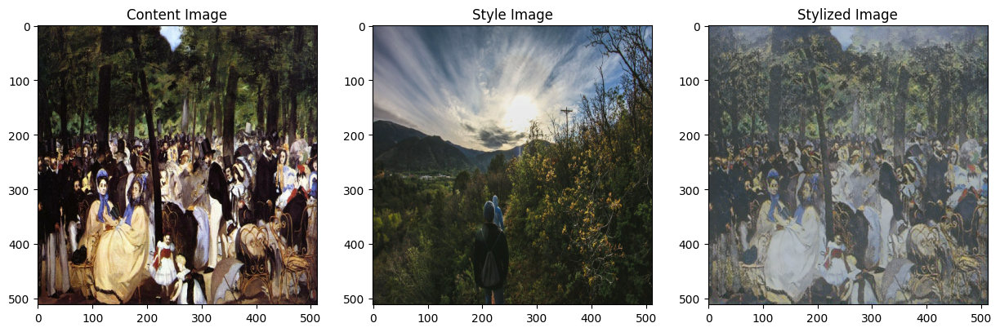

In [3]:
import os
import tensorflow as tf
from google.colab import drive
import IPython.display as display
import matplotlib.pyplot as plt
import matplotlib as mpl
from tensorflow.keras.preprocessing import image
import numpy as np
import PIL.Image
import time
import functools
import tensorflow_hub as hub

drive.mount('/content/drive')

mpl.rcParams['figure.figsize'] = (5, 5)
mpl.rcParams['axes.grid'] = False

content_images_dir = '/content/drive/MyDrive/content_images/'
styled_images_dir = '/content/drive/MyDrive/styled_images/'

content_images = [os.path.join(content_images_dir, f) for f in os.listdir(content_images_dir) if f.endswith('.jpg')]
style_images = [os.path.join(styled_images_dir, f) for f in os.listdir(styled_images_dir) if f.endswith('.jpg')]

def tensor_to_image(tensor):
    tensor = tensor * 255
    tensor = np.array(tensor, dtype=np.uint8)
    if np.ndim(tensor) > 3:
        assert tensor.shape[0] == 1
        tensor = tensor[0]
    return PIL.Image.fromarray(tensor)

def load_img(path_to_img, target_dim=(512, 512)):
    max_dim = max(target_dim)
    img = tf.io.read_file(path_to_img)
    img = tf.image.decode_image(img, channels=3)
    img = tf.image.convert_image_dtype(img, tf.float32)

    shape = tf.cast(tf.shape(img)[:-1], tf.float32)
    long_dim = max(shape)
    scale = max_dim / long_dim

    new_shape = tf.cast(shape * scale, tf.int32)
    img = tf.image.resize(img, [target_dim[0], target_dim[1]])
    img = img[tf.newaxis, :]
    return img

def imshow(image, title=None):
    if isinstance(image, PIL.Image.Image):
        image = np.array(image)
    if len(image.shape) > 3:
        image = tf.squeeze(image, axis=0)

    plt.imshow(image)
    if title:
        plt.title(title)

# Load a style transfer model from TensorFlow Hub
hub_model = hub.load('https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2')

def stylize_image(content_image_path, style_image_path, hub_model, target_dim=(512, 512)):
    content_img = load_img(content_image_path, target_dim)
    style_img = load_img(style_image_path, target_dim)
    stylized_image = hub_model(tf.constant(content_img), tf.constant(style_img))[0]
    return stylized_image

def evaluate_style_transfer(content_path, style_path, hub_model):
    content_image = load_img(content_path)
    style_image = load_img(style_path)

    stylized_image = stylize_image(content_path, style_path, hub_model)

    stylistic_accuracy = calculate_stylistic_accuracy(style_image, stylized_image)
    content_preservation = calculate_content_preservation(content_image, stylized_image)
    visual_appeal = calculate_visual_appeal(stylized_image)

    return stylistic_accuracy, content_preservation, visual_appeal, content_image, style_image, stylized_image

def calculate_stylistic_accuracy(style_image, stylized_image):
    mse = tf.reduce_mean(tf.square(style_image - stylized_image))
    return 1 / mse.numpy()  # Higher values indicate better stylistic accuracy

def calculate_content_preservation(content_image, stylized_image):
    ssim_index = tf.image.ssim(content_image, stylized_image, max_val=1.0)
    return ssim_index.numpy()  # Higher values indicate better content preservation

def calculate_visual_appeal(stylized_image):
    mean_intensity = tf.reduce_mean(stylized_image)
    return mean_intensity.numpy()  # Higher values indicate better visual appeal

# Evaluate and display style transfer metrics for all image pairs
for content_image_path, style_image_path in zip(content_images, style_images):
    stylistic_accuracy, content_preservation, visual_appeal, content_image, style_image, stylized_image = evaluate_style_transfer(
        content_image_path, style_image_path, hub_model)

    print(f'Content Image: {os.path.basename(content_image_path)}, Style Image: {os.path.basename(style_image_path)}')
    print(f'Stylistic Accuracy: {stylistic_accuracy}')
    print(f'Content Preservation: {content_preservation}')
    print(f'Visual Appeal: {visual_appeal}')
    print('-' * 50)

    # Display the content and style images
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1)
    imshow(tensor_to_image(content_image), 'Content Image')
    plt.subplot(1, 3, 2)
    imshow(tensor_to_image(style_image), 'Style Image')
    plt.subplot(1, 3, 3)
    imshow(tensor_to_image(stylized_image), 'Stylized Image')
    plt.show()
